This file will imitate Mohammed's developed Data Preparation and Preprocessing pipeline. It is beneficial to repeat this process to gather the augmented_df.csv file locally to aid in displaying filenames during our evaluation pipeline. 



We observe that Mohammed generates embeddings in the order of the augmented images above but chooses the 'best embedding' through highest norm criterion (we infer differences are due to different augmentations being made on the images). 

We can access the images selected as such:

In [6]:

filename_array = np.load('/Users/genesishang/bttai_novartis/CBIR_Pipeline/Data/image_files_uni.npy')


We can now map + access our embeddings to these filenames. 

Let us recreate Mohammed's UNI Evaluation pipeline

### Step 1: Import Libraries

In [7]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
from tqdm import tqdm
import faiss
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

### Step 2: Load Embeddings and Image Files

In [8]:
# Load embeddings and image files
embeddings = np.load('/Users/genesishang/bttai_novartis/CBIR_Pipeline/Data/embeddings_uni.npy')
image_files = np.load('/Users/genesishang/bttai_novartis/CBIR_Pipeline/Data/image_files_uni.npy')

print(f'Embeddings shape: {embeddings.shape}')
print(f'Number of images: {len(image_files)}')

Embeddings shape: (3360, 1024)
Number of images: 3360


### Step 3: Set Up Similarity Search with FAISS

In [9]:
# Define the dimension of the embeddings
d = embeddings.shape[1]

# Build the index
index = faiss.IndexFlatIP(d)

# Add embeddings to the index
index.add(embeddings)

print(f'Number of vectors in the index: {index.ntotal}')

Number of vectors in the index: 3360


### Step 4: Perform Image Retrieval

In [10]:
# Define the number of nearest neighbors to retrieve
k = 10  # Retrieve 5 neighbors plus the query image itself

# Perform the search
distances, indices = index.search(embeddings, k)

print(f'Distances shape: {distances.shape}')
print(f'Indices shape: {indices.shape}')

Distances shape: (3360, 10)
Indices shape: (3360, 10)


### Step 5: Visualize Retrieval Results

In [11]:
def display_images(image_paths, filenames, titles=None, cols=6, figsize=(15, 8)):
    rows = len(image_paths) // cols + int(len(image_paths) % cols != 0)
    plt.figure(figsize=figsize)
    for idx, img_path in enumerate(image_paths):
        plt.subplot(rows, cols, idx+1)
        img = Image.open(img_path)
        plt.imshow(img)
        plt.axis('off')
        if titles is not None:
            plt.title(titles[idx], fontsize=8)

        if filenames is not None:
            plt.text(
                0.5, -0.15, filenames[idx], 
                fontsize=5, ha='center', va='top', 
                transform=plt.gca().transAxes
            )

    plt.tight_layout()
    plt.show()

"
Visualize Retrieval for Sample Queries.

We can randomly select a few query images and visualize their retrieval results."

Let us create a function that retrieves our query images UID from the caption.json 

Query Image:


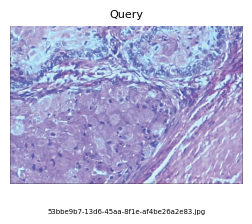

Retrieved Images:


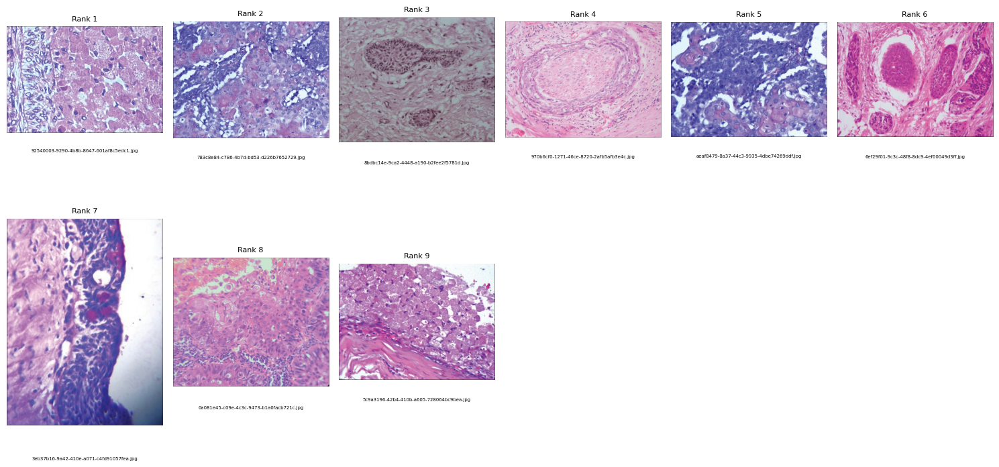

Query Image:


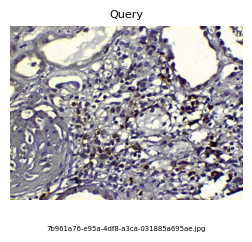

Retrieved Images:


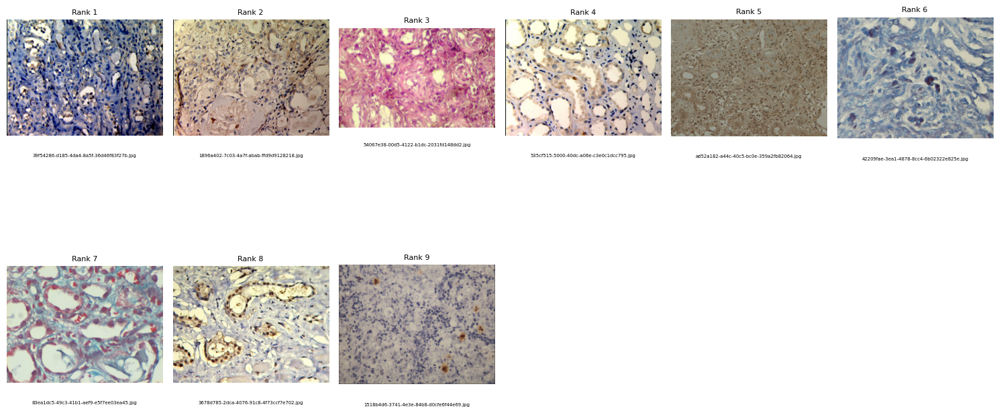

Query Image:


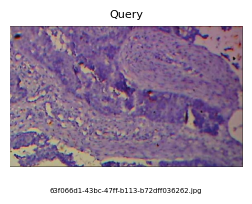

Retrieved Images:


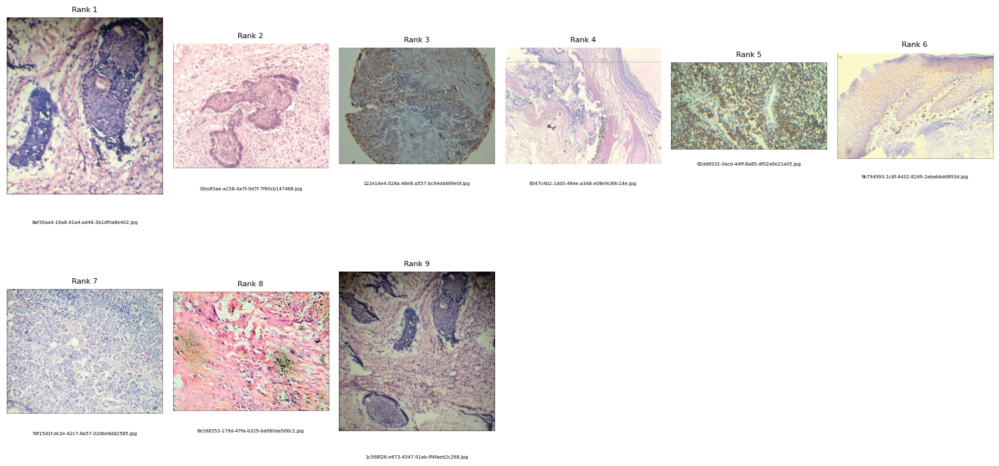

Query Image:


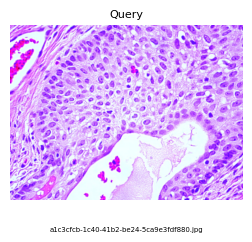

Retrieved Images:


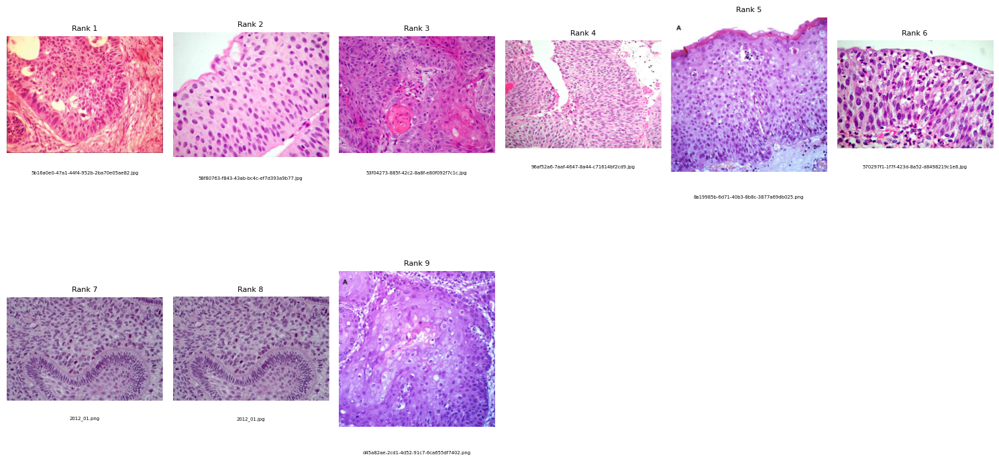

Query Image:


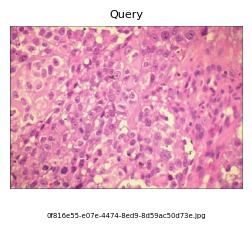

Retrieved Images:


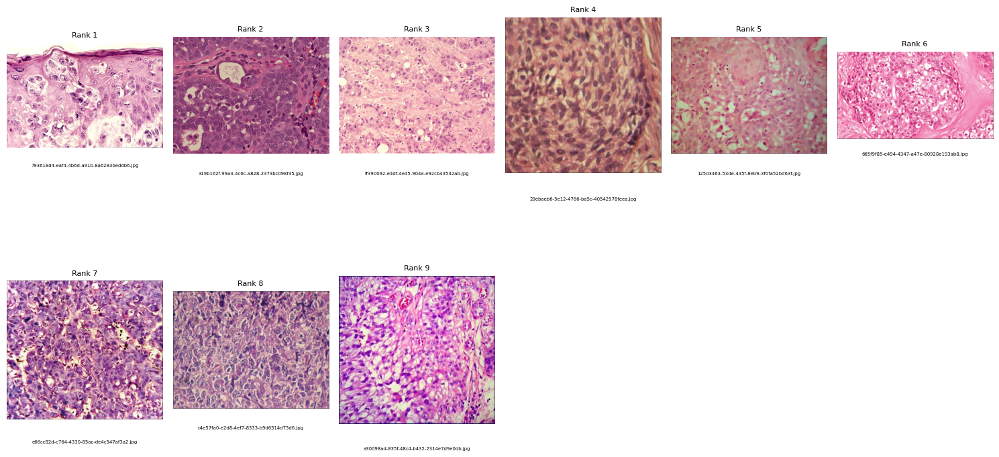

In [12]:
# Directory containing original images
original_images_dir = '/Users/genesishang/bttai_novartis/combined_dataset'  # Update this path accordingly

# Number of queries to visualize
num_queries = 5  # Adjust as needed

# Randomly select query indices
np.random.seed(42)  # For reproducibility
query_indices = np.random.choice(len(embeddings), size=num_queries, replace=False)

for idx in query_indices:
    # Get the query image
    query_image_file = image_files[idx]
    query_image_path = os.path.join(original_images_dir, query_image_file)
    
    # Get the retrieved images
    retrieved_indices = indices[idx][1:]  # Exclude the query image itself
    retrieved_image_files = image_files[retrieved_indices]
    retrieved_image_paths = [os.path.join(original_images_dir, img_file) for img_file in retrieved_image_files]
    
    # Display the query image
    print("Query Image:")
    display_images([query_image_path], filenames=[query_image_file], titles=['Query'])
    
    # Display the retrieved images
    print("Retrieved Images:")
    titles = [f"Rank {i+1}" for i in range(len(retrieved_image_paths))]
    display_images(retrieved_image_paths, filenames=retrieved_image_files, titles=titles)

### Step 6: Cluster Embeddings

In [13]:

print(np.any(np.isnan(embeddings)))


False


In [14]:
# Choose the number of clusters
num_clusters = 10  # Adjust as needed based on your dataset

# Initialize K-Means
kmeans = KMeans(n_clusters=num_clusters, random_state=42)

# Fit K-Means on the embeddings
cluster_labels = kmeans.fit_predict(embeddings)

# Add cluster labels to the DataFrame
df = pd.DataFrame({
    'image_file': image_files,
    'cluster_label': cluster_labels
})

### Step 7: Compute Unsupervised Evaluation Metrics

In [15]:
# Compute Silhouette Score
sil_score = silhouette_score(embeddings, cluster_labels)
print(f'Silhouette Score: {sil_score:.4f}')

Silhouette Score: 0.0235


Cluster 0 (Total Images: 443):


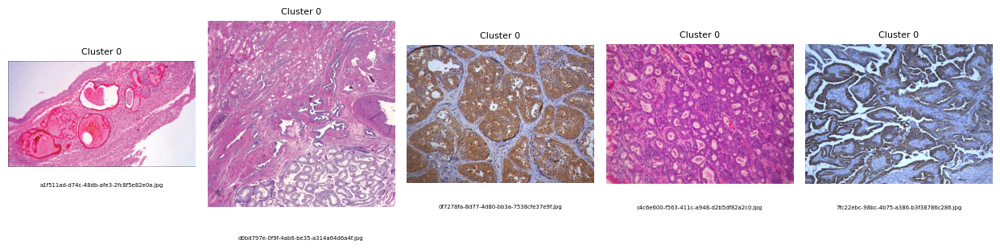

Cluster 1 (Total Images: 454):


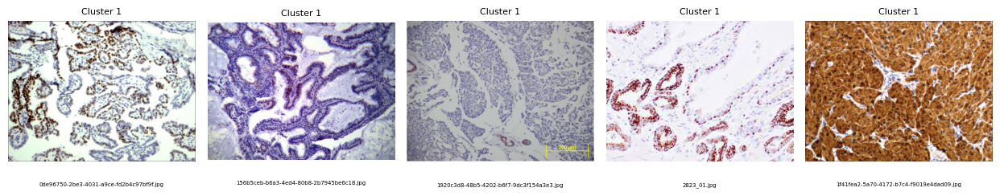

Cluster 2 (Total Images: 276):


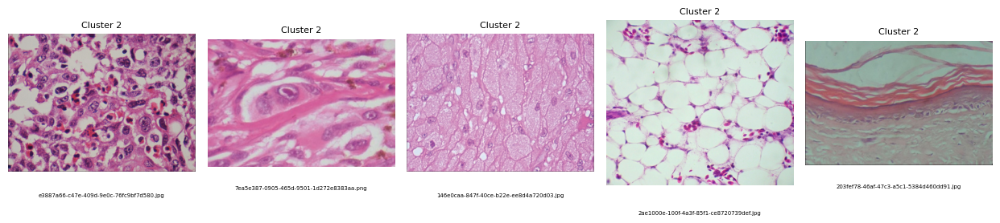

Cluster 3 (Total Images: 383):


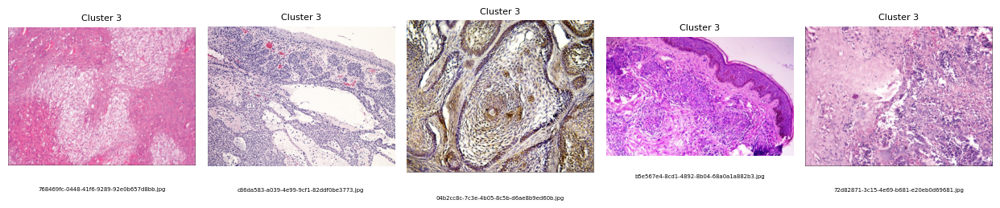

Cluster 4 (Total Images: 363):


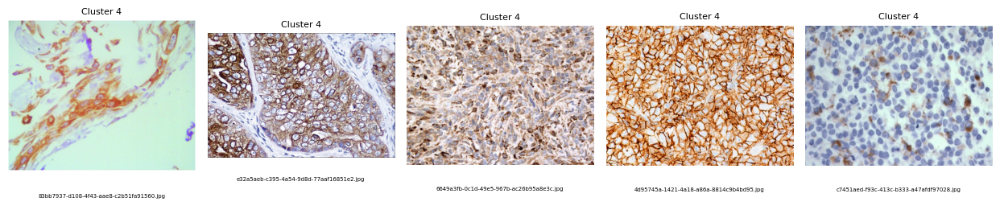

Cluster 5 (Total Images: 267):


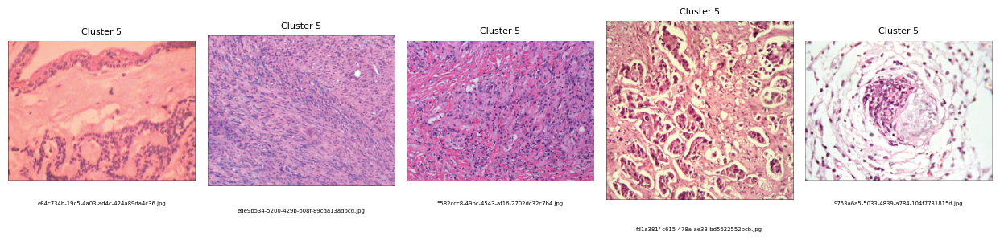

Cluster 6 (Total Images: 354):


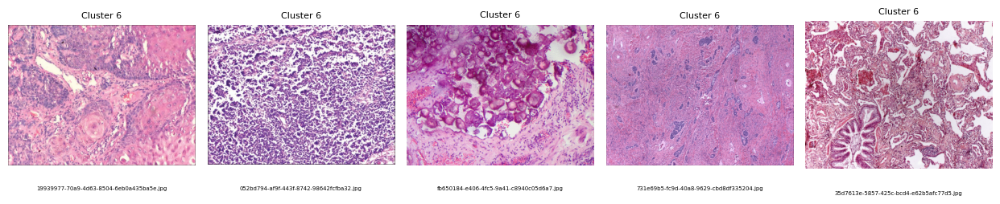

Cluster 7 (Total Images: 340):


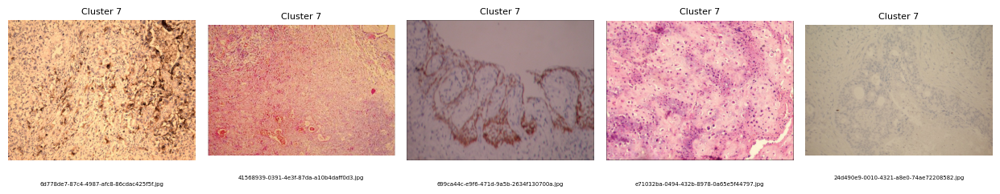

Cluster 8 (Total Images: 197):


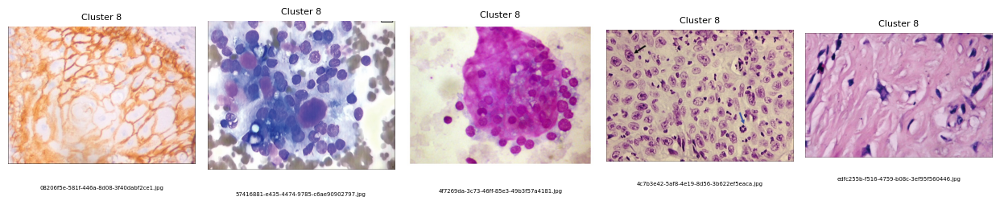

Cluster 9 (Total Images: 283):


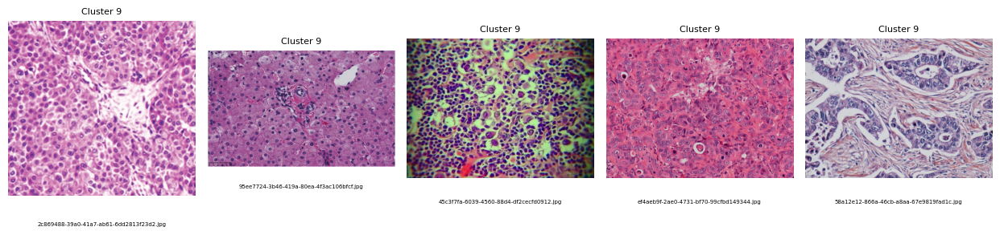

In [20]:
# Number of images to display per cluster
images_per_cluster = 5

for cluster in range(num_clusters):
    cluster_images = df[df['cluster_label'] == cluster]['image_file'].values
    if len(cluster_images) == 0:
        continue  # Skip empty clusters
    sample_images = np.random.choice(cluster_images, size=min(images_per_cluster, len(cluster_images)), replace=False)
    sample_image_paths = [os.path.join(original_images_dir, img_file) for img_file in sample_images]
    print(f"Cluster {cluster} (Total Images: {len(cluster_images)}):")
    display_images(sample_image_paths, filenames=sample_images, titles=[f"Cluster {cluster}"]*len(sample_image_paths))

## Performance on Grayscale Embeddigns

### Step 1: Load Embeddings and Image Files

In [21]:
# Load embeddings and image files
embeddings = np.load('/Users/genesishang/bttai_novartis/uni-model/grayscale_pubmed_embeddings.npy')
image_files = np.load('/Users/genesishang/bttai_novartis/CBIR_Pipeline/Data/image_files_uni.npy')

print(f'Embeddings shape: {embeddings.shape}')
print(f'Number of images: {len(image_files)}')

Embeddings shape: (3309, 1, 1024)
Number of images: 3360
